# 🧠 CSE 475 – Assignment 2 (Merged Notebook)
## Self‑Supervised Model 2 — **BYOL Pretext + Downstream YOLOv12n** (All‑in‑One)

**Course:** CSE 475 – Machine Learning  
**Section:** 03  

### 👥 Group 02
- Osama Bin Qashem (2022-2-60-058)  
- Saif Khan (2022-2-60-063)  
- Mahmudul Hasan Hamim (2022-2-60-079)  
- Nusrat Jahan Oishi (2022-2-60-033)  

**Dataset:** Roboflow Weeds Dataset (YOLO format) 🌿  
**Detector Backbone (Assignment 1):** YOLOv12n ✅  

---

## 🎯 What this single notebook covers
This merged notebook runs the complete BYOL pipeline end‑to‑end:

### ✅ Part A — BYOL Pretext (Self‑Supervised)
- Build a consistent SSL split: **80/10/10** overall + **20% labeled / 80% unlabeled** inside train
- Use **only unlabeled images** for BYOL (labels ignored)
- Run BYOL on **YOLOv12n backbone+neck** using feature hooks
- Save pretext backbones to:
  - `/kaggle/working/byol_backbones/<experiment_name>.pth`

### ✅ Part B — Downstream (Supervised Fine‑Tuning for Detection)
- Load each BYOL‑pretrained backbone (non‑strict load)
- Fine‑tune YOLOv12n detector on weeds detection (supervised Roboflow splits)
- Plot train/val loss + mAP curves per run
- Evaluate on test split and build a results table
- Auto‑select best BYOL run by `mAP@0.5:0.95`

### ✅ Part C — Explainability 🧠✨ (Same style as your YOLO notebooks)
- **ScoreCAM** (gradient‑free)
- **EigenCAM**

**Grid format (required):**
- **Columns:** Original | ScoreCAM | EigenCAM | Prediction  
- **Rows:** Model names vertically (e.g., Baseline YOLOv12n, BYOL‑pretrained YOLOv12n)

# 0) Setup ⚙️

In [1]:
# ============================================================
# Install dependencies
# ============================================================
!pip install -q ultralytics torchvision --no-deps

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 29.3 MB/s eta 0:00:00


In [2]:
# ============================================================
# Imports + global config
# ============================================================
import os
import random
import shutil
from pathlib import Path

import cv2
import yaml
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from tqdm.auto import tqdm
from ultralytics import YOLO

from PIL import Image

# Quiet down noisy logs
os.environ["DISABLE_MLFLOW_INTEGRATION"] = "1"
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

plt.rcParams["figure.figsize"] = (6, 6)
plt.rcParams["axes.grid"] = False

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

device = "cuda" if torch.cuda.is_available() else "cpu"
YOLO_DEVICE = 0 if torch.cuda.is_available() else "cpu"

print("Torch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
print("Device:", device)
print("YOLO_DEVICE:", YOLO_DEVICE)

# Paths
DATA_ROOT = Path("/kaggle/input/weeds-dataset")
RAW_DATA_YAML = DATA_ROOT / "data.yaml"
WORK_DIR = Path("/kaggle/working")
WORK_DIR.mkdir(parents=True, exist_ok=True)

print("DATA_ROOT:", DATA_ROOT)
print("RAW_DATA_YAML:", RAW_DATA_YAML)
print("WORK_DIR:", WORK_DIR)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Torch: 2.6.0+cu124
CUDA available: True
Device: cuda
YOLO_DEVICE: 0
DATA_ROOT: /kaggle/input/weeds-dataset
RAW_DATA_YAML: /kaggle/input/weeds-dataset/data.yaml
WORK_DIR: /kaggle/working


# 1) Dataset & SSL Split 🗂️

We use two “views” of the dataset:

## ✅ A) Supervised YOLO splits (Downstream)
Uses Roboflow’s original structure:
- `train/images + train/labels`
- `valid/images + valid/labels`
- `test/images + test/labels`

## ✅ B) Custom SSL split (Pretext)
For BYOL pretraining we build:
- Overall: **80% train pool, 10% val, 10% test**
- Inside train pool: **20% labeled, 80% unlabeled**

🔑 Only the **unlabeled** set is used in pretext.

In [3]:
IMG_EXTS = (".jpg", ".jpeg", ".png", ".bmp", ".webp")

def read_names_and_nc(raw_yaml: Path):
    names = ["Weeds"]
    nc = 1
    if raw_yaml.exists():
        try:
            y = yaml.safe_load(raw_yaml.read_text())
            if isinstance(y, dict):
                if "names" in y and y["names"]:
                    names = y["names"] if isinstance(y["names"], list) else list(y["names"])
                if "nc" in y:
                    nc = int(y["nc"])
        except Exception as e:
            print("[WARN] Could not parse data.yaml:", e)
    return names, nc

CLASS_NAMES, NC = read_names_and_nc(RAW_DATA_YAML)
print("NC:", NC)
print("CLASS_NAMES:", CLASS_NAMES)

def collect_all_images(root: Path):
    splits = ["train", "valid", "test"]
    img_paths = []
    for sp in splits:
        img_dir = root / sp / "images"
        for ext in IMG_EXTS:
            img_paths.extend(list(img_dir.glob(f"*{ext}")))
    return sorted(img_paths)

def label_path_for_image(img_path: Path):
    # Convert /<split>/images/xxx.jpg -> /<split>/labels/xxx.txt
    split = img_path.parent.parent.name  # train / valid / test
    return DATA_ROOT / split / "labels" / f"{img_path.stem}.txt"

def safe_link_or_copy(src: Path, dst: Path):
    dst.parent.mkdir(parents=True, exist_ok=True)
    if dst.exists():
        return
    try:
        os.symlink(src, dst)
    except Exception:
        shutil.copy2(src, dst)

# SSL root (unique name to avoid collisions)
SSL_ROOT = WORK_DIR / "weeds_ssl_byol_merged"
for p in [
    SSL_ROOT / "train_labeled" / "images",
    SSL_ROOT / "train_labeled" / "labels",
    SSL_ROOT / "train_unlabeled" / "images",
    SSL_ROOT / "val" / "images",
    SSL_ROOT / "val" / "labels",
    SSL_ROOT / "test" / "images",
    SSL_ROOT / "test" / "labels",
]:
    p.mkdir(parents=True, exist_ok=True)

print("SSL_ROOT:", SSL_ROOT)

NC: 1
CLASS_NAMES: ['Weeds']
SSL_ROOT: /kaggle/working/weeds_ssl_byol_merged


In [4]:
# ============================================================
# Build split (deterministic)
# ============================================================
all_imgs = collect_all_images(DATA_ROOT)
assert len(all_imgs) > 0, "No images found in dataset."

rnd = random.Random(SEED)
rnd.shuffle(all_imgs)

num_total = len(all_imgs)
n_train = int(0.8 * num_total)
n_val = int(0.1 * num_total)
n_test = num_total - n_train - n_val

train_pool = all_imgs[:n_train]
val_imgs = all_imgs[n_train:n_train + n_val]
test_imgs = all_imgs[n_train + n_val:]

n_labeled = int(0.2 * len(train_pool))
train_labeled_imgs = train_pool[:n_labeled]
train_unlabeled_imgs = train_pool[n_labeled:]

print(f"Total images: {num_total}")
print(f"Train pool: {len(train_pool)} | Val: {len(val_imgs)} | Test: {len(test_imgs)}")
print(f"Train labeled: {len(train_labeled_imgs)} | Train unlabeled: {len(train_unlabeled_imgs)}")

Total images: 4203
Train pool: 3362 | Val: 420 | Test: 421
Train labeled: 672 | Train unlabeled: 2690


In [5]:
# ============================================================
# Materialize split using symlinks/copies
# Prefix filenames with original split to avoid collisions.
# ============================================================
def export_with_labels(img_list, out_img_dir: Path, out_lbl_dir: Path, desc="Export"):
    for img_path in tqdm(img_list, desc=desc):
        split = img_path.parent.parent.name  # train/valid/test
        out_name = f"{split}_{img_path.name}"
        out_img = out_img_dir / out_name
        safe_link_or_copy(img_path, out_img)

        src_lbl = label_path_for_image(img_path)
        out_lbl = out_lbl_dir / f"{Path(out_name).stem}.txt"
        if src_lbl.exists():
            safe_link_or_copy(src_lbl, out_lbl)
        else:
            out_lbl.write_text("")

def export_images_only(img_list, out_img_dir: Path, desc="Export unlabeled"):
    for img_path in tqdm(img_list, desc=desc):
        split = img_path.parent.parent.name
        out_name = f"{split}_{img_path.name}"
        out_img = out_img_dir / out_name
        safe_link_or_copy(img_path, out_img)

export_with_labels(
    train_labeled_imgs,
    SSL_ROOT / "train_labeled" / "images",
    SSL_ROOT / "train_labeled" / "labels",
    desc="✅ Export train_labeled (GT)"
)
export_images_only(
    train_unlabeled_imgs,
    SSL_ROOT / "train_unlabeled" / "images",
    desc="🕵️ Export train_unlabeled (images only)"
)
export_with_labels(
    val_imgs,
    SSL_ROOT / "val" / "images",
    SSL_ROOT / "val" / "labels",
    desc="✅ Export val (GT)"
)
export_with_labels(
    test_imgs,
    SSL_ROOT / "test" / "images",
    SSL_ROOT / "test" / "labels",
    desc="✅ Export test (GT)"
)

print("✅ SSL split ready at:", SSL_ROOT)

✅ Export train_labeled (GT):   0%|          | 0/672 [00:00<?, ?it/s]

🕵️ Export train_unlabeled (images only):   0%|          | 0/2690 [00:00<?, ?it/s]

✅ Export val (GT):   0%|          | 0/420 [00:00<?, ?it/s]

✅ Export test (GT):   0%|          | 0/421 [00:00<?, ?it/s]

✅ SSL split ready at: /kaggle/working/weeds_ssl_byol_merged


In [6]:
# ============================================================
# Baseline-style YAML for downstream (Roboflow supervised splits)
# ============================================================
BASELINE_YAML = WORK_DIR / "weeds_baseline.yaml"
baseline_yaml = {
    "train": str((DATA_ROOT / "train" / "images").resolve()).replace("\\", "/"),
    "val":   str((DATA_ROOT / "valid" / "images").resolve()).replace("\\", "/"),
    "test":  str((DATA_ROOT / "test" / "images").resolve()).replace("\\", "/"),
    "nc": NC,
    "names": CLASS_NAMES,
}
BASELINE_YAML.write_text(yaml.dump(baseline_yaml, sort_keys=False))
print("✅ Baseline YAML:", BASELINE_YAML)

✅ Baseline YAML: /kaggle/working/weeds_baseline.yaml


## 👀 Quick sanity visualization (SSL labeled subset)
Confirm label alignment.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


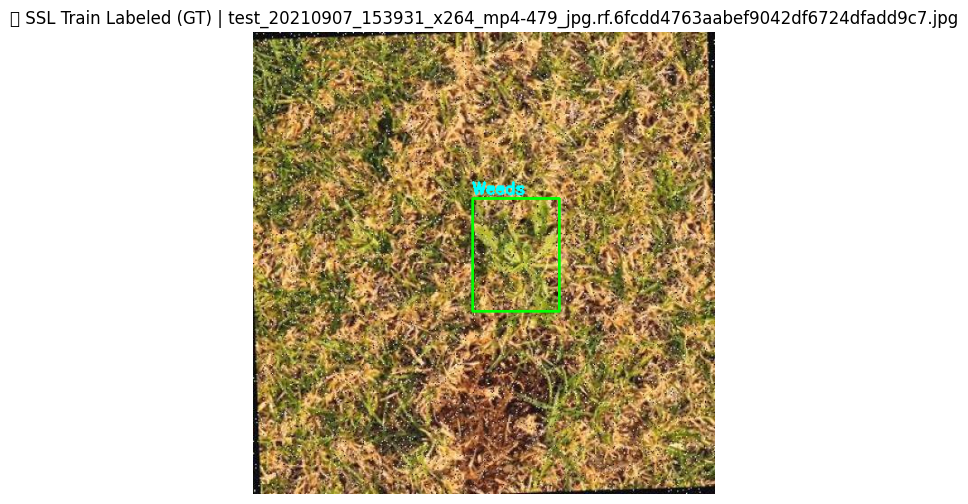

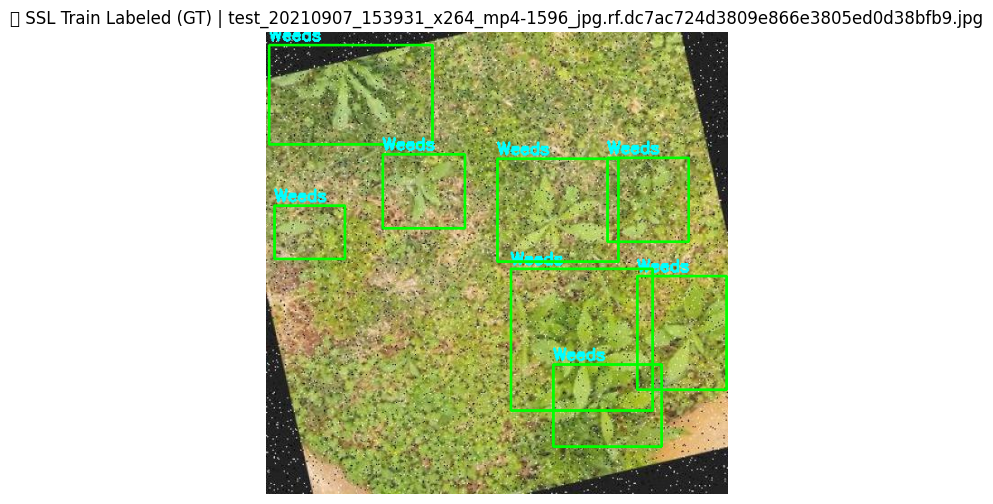

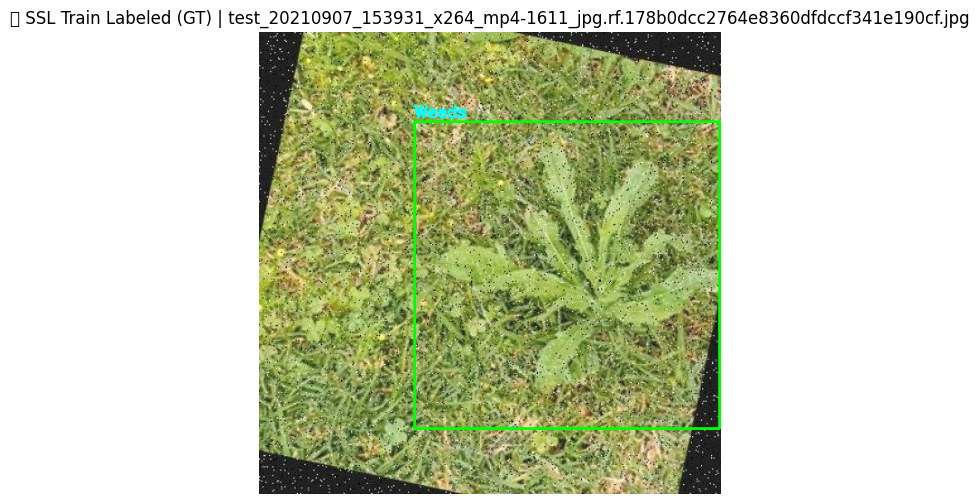

In [7]:
def read_yolo_labels(txt_path: Path):
    rows = []
    if not txt_path.exists():
        return rows
    txt = txt_path.read_text().strip()
    if not txt:
        return rows
    for line in txt.splitlines():
        parts = line.strip().split()
        if len(parts) < 5:
            continue
        cls, x, y, w, h = parts[:5]
        rows.append((int(float(cls)), float(x), float(y), float(w), float(h)))
    return rows

def visualize_yolo_folder(image_dir: Path, label_dir: Path, title="SSL Labeled", num_images=3):
    img_files = []
    for ext in IMG_EXTS:
        img_files.extend(list(image_dir.glob(f"*{ext}")))
    if not img_files:
        print("No images found:", image_dir)
        return

    rnd = random.Random(SEED)
    rnd.shuffle(img_files)
    img_files = img_files[:num_images]

    for img_path in img_files:
        lbl_path = label_dir / f"{img_path.stem}.txt"
        bgr = cv2.imread(str(img_path))
        if bgr is None:
            continue
        h, w = bgr.shape[:2]

        for cls, x, y, bw, bh in read_yolo_labels(lbl_path):
            x1 = int((x - bw/2) * w); y1 = int((y - bh/2) * h)
            x2 = int((x + bw/2) * w); y2 = int((y + bh/2) * h)
            cv2.rectangle(bgr, (x1,y1), (x2,y2), (0,255,0), 2)
            name = CLASS_NAMES[cls] if cls < len(CLASS_NAMES) else str(cls)
            cv2.putText(bgr, name, (x1, max(0,y1-5)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,0), 2)

        rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
        plt.figure()
        plt.imshow(rgb); plt.axis("off")
        plt.title(f"{title} | {img_path.name}")
        plt.show()

visualize_yolo_folder(
    SSL_ROOT / "train_labeled" / "images",
    SSL_ROOT / "train_labeled" / "labels",
    title="✅ SSL Train Labeled (GT)",
    num_images=3
)

# 2) BYOL Pretext (Self‑Supervised) 🧠🌱

We implement BYOL on **YOLOv12n backbone+neck** using unlabeled images:
- Online: encoder(backbone+neck) → projector → predictor  
- Target: EMA copy of encoder → projector (no predictor)

✅ Data: `train_unlabeled/images` only  
✅ Output: backbone checkpoints saved in:
- `/kaggle/working/byol_backbones/<experiment_name>.pth`

In [8]:
# ============================================================
# BYOL: Unlabeled pool + save directory
# ============================================================
SSL_UNLABELED_DIR = SSL_ROOT / "train_unlabeled" / "images"
BYOL_SSL_WEIGHTS_DIR = WORK_DIR / "byol_backbones"
BYOL_SSL_WEIGHTS_DIR.mkdir(parents=True, exist_ok=True)

print("Unlabeled dir:", SSL_UNLABELED_DIR, "| exists:", SSL_UNLABELED_DIR.exists())
print("BYOL weights dir:", BYOL_SSL_WEIGHTS_DIR)

Unlabeled dir: /kaggle/working/weeds_ssl_byol_merged/train_unlabeled/images | exists: True
BYOL weights dir: /kaggle/working/byol_backbones


In [9]:
# ============================================================
# Helper: Hook into YOLO Detect head to capture backbone+neck features
# ============================================================
def get_detect_module(model_module):
    # Prefer last module if it looks like Detect, else search.
    try:
        last = model_module.model[-1]
        if "Detect" in last.__class__.__name__:
            return last
    except Exception:
        pass
    cand = None
    for m in model_module.modules():
        if "Detect" in m.__class__.__name__:
            cand = m
    # Fallback: last module
    return cand if cand is not None else list(model_module.modules())[-1]

class DetectInputHook:
    def __init__(self, detect_module):
        self.handle = detect_module.register_forward_pre_hook(self.hook)
        self.feats = None
    def hook(self, module, inputs):
        # inputs[0] should be list of feature maps for Detect
        self.feats = list(inputs[0])
        return None
    def close(self):
        self.handle.remove()

# Feature aggregation mode
# "concat": global avg pool all FPN levels and concatenate
# "last":   only use last (highest-level) feature map
CURRENT_FEAT_MODE = "concat"

def global_pool_concat(feat_list):
    if feat_list is None:
        raise RuntimeError("No features captured (hook returned None).")
    if CURRENT_FEAT_MODE == "last":
        feat_list = [feat_list[-1]]
    pooled = []
    for f in feat_list:
        x = torch.mean(f, dim=[2, 3])  # global avg pool (B,C)
        pooled.append(x)
    return torch.cat(pooled, dim=1)

In [10]:
# ============================================================
# BYOL augmentations + dataset
# ============================================================
byol_transform = transforms.Compose(
    [
        transforms.RandomResizedCrop(160, scale=(0.4, 1.0)),
        transforms.RandomHorizontalFlip(),
        transforms.ColorJitter(0.3, 0.3, 0.3, 0.1),
        transforms.RandomGrayscale(0.2),
        transforms.GaussianBlur(kernel_size=7, sigma=(0.1, 2.0)),
        transforms.ToTensor(),
    ]
)

class BYOLViews(Dataset):
    def __init__(self, img_dir, transform):
        self.paths = []
        img_dir = Path(img_dir)
        for ext in IMG_EXTS:
            self.paths.extend(list(img_dir.glob(f"*{ext}")))
        self.paths = sorted(self.paths)
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        path = self.paths[idx]
        img = cv2.imread(str(path))
        if img is None:
            # fallback: blank image (shouldn't happen unless file is broken)
            img = np.zeros((160, 160, 3), dtype=np.uint8)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = Image.fromarray(img)
        v1 = self.transform(img)
        v2 = self.transform(img)
        return v1, v2

def byol_loss(p, z):
    p = F.normalize(p, dim=1)
    z = F.normalize(z, dim=1)
    return 2 - 2 * (p * z).sum(dim=1).mean()

In [11]:
# ============================================================
# BYOL experiments (same style as your notebook)
# ============================================================
BASE_MOMENTUM = 0.996

PRETEXT_EXPERIMENTS = [
    # (1) Original setup: concat all features
    {"name": "byol_concat_e100_b8", "epochs": 100, "batch": 8,  "feat_mode": "concat", "proj_dim": 256},
]

for exp in PRETEXT_EXPERIMENTS:
    print(exp["name"], exp)

byol_concat_e100_b8 {'name': 'byol_concat_e100_b8', 'epochs': 100, 'batch': 8, 'feat_mode': 'concat', 'proj_dim': 256}


In [12]:
# ============================================================
# BYOL model utilities
# ============================================================
def build_projector(feat_dim, out_dim):
    return nn.Sequential(
        nn.Linear(feat_dim, 512, bias=False),
        nn.BatchNorm1d(512),
        nn.ReLU(inplace=True),
        nn.Linear(512, out_dim, bias=False),
    )

def build_predictor(out_dim):
    return nn.Sequential(
        nn.Linear(out_dim, 512, bias=False),
        nn.BatchNorm1d(512),
        nn.ReLU(inplace=True),
        nn.Linear(512, out_dim, bias=False),
    )

def ema_update(online, target, m):
    for p_o, p_t in zip(online.parameters(), target.parameters()):
        p_t.data.mul_(m).add_(p_o.data, alpha=1 - m)

def momentum_scheduled(step, total, base_m=BASE_MOMENTUM):
    # cosine schedule toward 1.0
    return 1 - (1 - base_m) * (np.cos(np.pi * step / total) + 1) / 2

def load_yolo12n_model():
    """
    Keep your style ("yolo12n.yaml") but add a safe fallback if yaml isn't found.
    Returns the underlying torch model module (not YOLO wrapper).
    """
    try:
        return YOLO("yolo12n.yaml").model
    except Exception as e1:
        print("[WARN] Failed to load yolo12n.yaml, fallback to yolo12n.pt:", e1)
        return YOLO("yolo12n.pt").model

Unlabeled BYOL images: 2690

🔄 BYOL pre-training – experiment: byol_concat_e100_b8
{'name': 'byol_concat_e100_b8', 'epochs': 100, 'batch': 8, 'feat_mode': 'concat', 'proj_dim': 256}
Backbone+neck BYOL feature dim: 448


/tmp/ipykernel_19/987412615.py:59: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device == "cuda"))


byol_concat_e100_b8 | BYOL 1/100:   0%|          | 0/336 [00:00<?, ?it/s]

/tmp/ipykernel_19/987412615.py:80: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device == "cuda")):


byol_concat_e100_b8 | Epoch 1/100 - loss: 1.2082


byol_concat_e100_b8 | BYOL 2/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 2/100 - loss: 0.9148


byol_concat_e100_b8 | BYOL 3/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 3/100 - loss: 0.8543


byol_concat_e100_b8 | BYOL 4/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 4/100 - loss: 1.3415


byol_concat_e100_b8 | BYOL 5/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 5/100 - loss: 1.3157


byol_concat_e100_b8 | BYOL 6/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 6/100 - loss: 1.3598


byol_concat_e100_b8 | BYOL 7/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 7/100 - loss: 1.2145


byol_concat_e100_b8 | BYOL 8/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 8/100 - loss: 0.9850


byol_concat_e100_b8 | BYOL 9/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 9/100 - loss: 0.8575


byol_concat_e100_b8 | BYOL 10/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 10/100 - loss: 0.7639


byol_concat_e100_b8 | BYOL 11/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 11/100 - loss: 0.7203


byol_concat_e100_b8 | BYOL 12/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 12/100 - loss: 0.6534


byol_concat_e100_b8 | BYOL 13/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 13/100 - loss: 0.6558


byol_concat_e100_b8 | BYOL 14/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 14/100 - loss: 0.6794


byol_concat_e100_b8 | BYOL 15/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 15/100 - loss: 0.6243


byol_concat_e100_b8 | BYOL 16/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 16/100 - loss: 0.6239


byol_concat_e100_b8 | BYOL 17/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 17/100 - loss: 0.6616


byol_concat_e100_b8 | BYOL 18/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 18/100 - loss: 0.6012


byol_concat_e100_b8 | BYOL 19/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 19/100 - loss: 0.5797


byol_concat_e100_b8 | BYOL 20/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 20/100 - loss: 0.5791


byol_concat_e100_b8 | BYOL 21/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 21/100 - loss: 0.5475


byol_concat_e100_b8 | BYOL 22/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 22/100 - loss: 0.5076


byol_concat_e100_b8 | BYOL 23/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 23/100 - loss: 0.5258


byol_concat_e100_b8 | BYOL 24/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 24/100 - loss: 0.5413


byol_concat_e100_b8 | BYOL 25/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 25/100 - loss: 0.4825


byol_concat_e100_b8 | BYOL 26/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 26/100 - loss: 0.4879


byol_concat_e100_b8 | BYOL 27/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 27/100 - loss: 0.4892


byol_concat_e100_b8 | BYOL 28/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 28/100 - loss: 0.4963


byol_concat_e100_b8 | BYOL 29/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 29/100 - loss: 0.4736


byol_concat_e100_b8 | BYOL 30/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 30/100 - loss: 0.4563


byol_concat_e100_b8 | BYOL 31/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 31/100 - loss: 0.4570


byol_concat_e100_b8 | BYOL 32/100:   0%|          | 0/336 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7ffa34760c20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
Exception ignored in:     self._shutdown_workers()
<function _MultiProcessingDataLoaderIter.__del__ at 0x7ffa34760c20>  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers

    if w.is_alive():Traceback (most recent call last):

  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
       self._shutdown_workers()  
   File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
 ^    ^if w.is_alive():^
^ ^  ^ ^  ^ ^^^^^^
^  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
^    assert self._parent_pid == os.getpid(), 'can only test a child process'^
^ ^ ^ ^ ^  ^  ^  
   File "/usr

byol_concat_e100_b8 | Epoch 32/100 - loss: 0.4475


byol_concat_e100_b8 | BYOL 33/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 33/100 - loss: 0.4773


byol_concat_e100_b8 | BYOL 34/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 34/100 - loss: 0.4262


byol_concat_e100_b8 | BYOL 35/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 35/100 - loss: 0.4145


byol_concat_e100_b8 | BYOL 36/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 36/100 - loss: 0.4061


byol_concat_e100_b8 | BYOL 37/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 37/100 - loss: 0.4070


byol_concat_e100_b8 | BYOL 38/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 38/100 - loss: 0.4093


byol_concat_e100_b8 | BYOL 39/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 39/100 - loss: 0.4301


byol_concat_e100_b8 | BYOL 40/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 40/100 - loss: 0.4351


byol_concat_e100_b8 | BYOL 41/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 41/100 - loss: 0.4258


byol_concat_e100_b8 | BYOL 42/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 42/100 - loss: 0.3992


byol_concat_e100_b8 | BYOL 43/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 43/100 - loss: 0.4258


byol_concat_e100_b8 | BYOL 44/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 44/100 - loss: 0.4000


byol_concat_e100_b8 | BYOL 45/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 45/100 - loss: 0.4168


byol_concat_e100_b8 | BYOL 46/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 46/100 - loss: 0.3889


byol_concat_e100_b8 | BYOL 47/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 47/100 - loss: 0.4156


byol_concat_e100_b8 | BYOL 48/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 48/100 - loss: 0.4042


byol_concat_e100_b8 | BYOL 49/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 49/100 - loss: 0.4053


byol_concat_e100_b8 | BYOL 50/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 50/100 - loss: 0.4143


byol_concat_e100_b8 | BYOL 51/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 51/100 - loss: 0.4096


byol_concat_e100_b8 | BYOL 52/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 52/100 - loss: 0.4081


byol_concat_e100_b8 | BYOL 53/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 53/100 - loss: 0.3985


byol_concat_e100_b8 | BYOL 54/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 54/100 - loss: 0.3764


byol_concat_e100_b8 | BYOL 55/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 55/100 - loss: 0.4088


byol_concat_e100_b8 | BYOL 56/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 56/100 - loss: 0.3908


byol_concat_e100_b8 | BYOL 57/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 57/100 - loss: 0.3754


byol_concat_e100_b8 | BYOL 58/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 58/100 - loss: 0.3849


byol_concat_e100_b8 | BYOL 59/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 59/100 - loss: 0.3857


byol_concat_e100_b8 | BYOL 60/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 60/100 - loss: 0.4035


byol_concat_e100_b8 | BYOL 61/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 61/100 - loss: 0.3541


byol_concat_e100_b8 | BYOL 62/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 62/100 - loss: 0.3843


byol_concat_e100_b8 | BYOL 63/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 63/100 - loss: 0.3565


byol_concat_e100_b8 | BYOL 64/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 64/100 - loss: 0.3824


byol_concat_e100_b8 | BYOL 65/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 65/100 - loss: 0.3765


byol_concat_e100_b8 | BYOL 66/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 66/100 - loss: 0.3548


byol_concat_e100_b8 | BYOL 67/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 67/100 - loss: 0.3612


byol_concat_e100_b8 | BYOL 68/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 68/100 - loss: 0.3505


byol_concat_e100_b8 | BYOL 69/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 69/100 - loss: 0.3459


byol_concat_e100_b8 | BYOL 70/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 70/100 - loss: 0.3754


byol_concat_e100_b8 | BYOL 71/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 71/100 - loss: 0.3463


byol_concat_e100_b8 | BYOL 72/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 72/100 - loss: 0.3678


byol_concat_e100_b8 | BYOL 73/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 73/100 - loss: 0.3600


byol_concat_e100_b8 | BYOL 74/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 74/100 - loss: 0.3438


byol_concat_e100_b8 | BYOL 75/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 75/100 - loss: 0.3273


byol_concat_e100_b8 | BYOL 76/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 76/100 - loss: 0.3498


byol_concat_e100_b8 | BYOL 77/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 77/100 - loss: 0.3354


byol_concat_e100_b8 | BYOL 78/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 78/100 - loss: 0.3251


byol_concat_e100_b8 | BYOL 79/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 79/100 - loss: 0.3598


byol_concat_e100_b8 | BYOL 80/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 80/100 - loss: 0.3536


byol_concat_e100_b8 | BYOL 81/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 81/100 - loss: 0.3462


byol_concat_e100_b8 | BYOL 82/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 82/100 - loss: 0.3216


byol_concat_e100_b8 | BYOL 83/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 83/100 - loss: 0.3443


byol_concat_e100_b8 | BYOL 84/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 84/100 - loss: 0.3430


byol_concat_e100_b8 | BYOL 85/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 85/100 - loss: 0.3402


byol_concat_e100_b8 | BYOL 86/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 86/100 - loss: 0.3377


byol_concat_e100_b8 | BYOL 87/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 87/100 - loss: 0.3316


byol_concat_e100_b8 | BYOL 88/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 88/100 - loss: 0.3300


byol_concat_e100_b8 | BYOL 89/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 89/100 - loss: 0.3347


byol_concat_e100_b8 | BYOL 90/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 90/100 - loss: 0.3310


byol_concat_e100_b8 | BYOL 91/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 91/100 - loss: 0.3385


byol_concat_e100_b8 | BYOL 92/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 92/100 - loss: 0.3180


byol_concat_e100_b8 | BYOL 93/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 93/100 - loss: 0.3328


byol_concat_e100_b8 | BYOL 94/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 94/100 - loss: 0.3289


byol_concat_e100_b8 | BYOL 95/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 95/100 - loss: 0.3463


byol_concat_e100_b8 | BYOL 96/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 96/100 - loss: 0.3234


byol_concat_e100_b8 | BYOL 97/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 97/100 - loss: 0.3322


byol_concat_e100_b8 | BYOL 98/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 98/100 - loss: 0.3233


byol_concat_e100_b8 | BYOL 99/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 99/100 - loss: 0.3415


byol_concat_e100_b8 | BYOL 100/100:   0%|          | 0/336 [00:00<?, ?it/s]

byol_concat_e100_b8 | Epoch 100/100 - loss: 0.3361
✓ Saved BYOL backbone weights → /kaggle/working/byol_backbones/byol_concat_e100_b8.pth


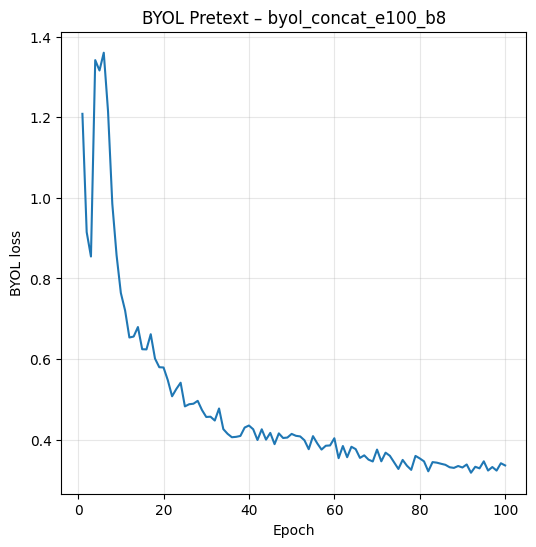

In [13]:
# ============================================================
# Run BYOL pretraining (skip if weights exist)
# ============================================================
ds = BYOLViews(SSL_UNLABELED_DIR, byol_transform)
print("Unlabeled BYOL images:", len(ds))
assert len(ds) > 0, "No unlabeled images found. Check SSL split."

for exp in PRETEXT_EXPERIMENTS:
    exp_name = exp["name"]
    exp_weights_path = BYOL_SSL_WEIGHTS_DIR / f"{exp_name}.pth"

    if exp_weights_path.exists():
        print(f"✓ Skipping {exp_name} – weights already exist at {exp_weights_path}")
        continue

    print(f"\n🔄 BYOL pre-training – experiment: {exp_name}")
    print(exp)

    CURRENT_FEAT_MODE = exp["feat_mode"]

    online_full = load_yolo12n_model().to(device)
    target_full = load_yolo12n_model().to(device)
    target_full.load_state_dict(online_full.state_dict())
    for p in target_full.parameters():
        p.requires_grad = False

    online_hook = DetectInputHook(get_detect_module(online_full))
    target_hook = DetectInputHook(get_detect_module(target_full))

    # Determine feature dim for this feat_mode
    with torch.no_grad():
        dmy = torch.zeros(1, 3, 160, 160, device=device)
        _ = online_full(dmy)
        feat_dim = global_pool_concat(online_hook.feats).shape[1]
    print("Backbone+neck BYOL feature dim:", feat_dim)

    proj_o = build_projector(feat_dim, exp["proj_dim"]).to(device)
    proj_t = build_projector(feat_dim, exp["proj_dim"]).to(device)
    pred_o = build_predictor(exp["proj_dim"]).to(device)

    proj_t.load_state_dict(proj_o.state_dict())
    for p in proj_t.parameters():
        p.requires_grad = False

    opt = torch.optim.AdamW(
        list(online_full.parameters()) + list(proj_o.parameters()) + list(pred_o.parameters()),
        lr=2e-4,
        weight_decay=1e-4,
    )

    dl = DataLoader(
        ds,
        batch_size=int(exp["batch"]),
        shuffle=True,
        num_workers=2,
        drop_last=True,
    )

    scaler = torch.cuda.amp.GradScaler(enabled=(device == "cuda"))

    total_steps = int(exp["epochs"]) * len(dl)
    step = 0
    epoch_losses = []

    for ep in range(int(exp["epochs"])):
        online_full.train()
        proj_o.train()
        pred_o.train()

        running = 0.0
        num_batches = 0

        pbar = tqdm(dl, desc=f"{exp_name} | BYOL {ep+1}/{exp['epochs']}", leave=False)
        for v1, v2 in pbar:
            v1 = v1.to(device, non_blocking=True)
            v2 = v2.to(device, non_blocking=True)

            m_cur = momentum_scheduled(step, total_steps)

            with torch.cuda.amp.autocast(enabled=(device == "cuda")):
                _ = online_full(v1)
                h1 = global_pool_concat(online_hook.feats)
                _ = online_full(v2)
                h2 = global_pool_concat(online_hook.feats)

                z1_o = proj_o(h1)
                z2_o = proj_o(h2)
                p1 = pred_o(z1_o)
                p2 = pred_o(z2_o)

                with torch.no_grad():
                    ema_update(online_full, target_full, m_cur)
                    ema_update(proj_o, proj_t, m_cur)

                    _ = target_full(v1)
                    h1_t = global_pool_concat(target_hook.feats)
                    _ = target_full(v2)
                    h2_t = global_pool_concat(target_hook.feats)

                    z1_t = proj_t(h1_t)
                    z2_t = proj_t(h2_t)

                loss = byol_loss(p1, z2_t) + byol_loss(p2, z1_t)

            scaler.scale(loss).backward()
            scaler.step(opt)
            scaler.update()
            opt.zero_grad(set_to_none=True)

            running += float(loss.item())
            num_batches += 1
            step += 1
            pbar.set_postfix(loss=running / max(1, num_batches))

        epoch_loss = running / max(1, num_batches)
        epoch_losses.append(epoch_loss)
        print(f"{exp_name} | Epoch {ep+1}/{exp['epochs']} - loss: {epoch_loss:.4f}")

    # Save backbone+neck (drop Detect head)
    last_idx = len(online_full.model) - 1
    filtered_state = {
        k: v for k, v in online_full.state_dict().items()
        if not k.startswith(f"model.{last_idx}")
    }
    torch.save(filtered_state, exp_weights_path)
    print("✓ Saved BYOL backbone weights →", exp_weights_path)

    online_hook.close()
    target_hook.close()

    # Plot BYOL training loss curve
    plt.figure()
    plt.plot(range(1, len(epoch_losses) + 1), epoch_losses)
    plt.xlabel("Epoch")
    plt.ylabel("BYOL loss")
    plt.title(f"BYOL Pretext – {exp_name}")
    plt.grid(True, alpha=0.3)
    plt.show()

    # Cleanup
    del online_full, target_full, proj_o, proj_t, pred_o, dl
    import gc
    gc.collect()
    if device == "cuda":
        torch.cuda.empty_cache()

# 3) Downstream Fine‑Tuning 🎯 (YOLOv12n + BYOL Pretraining)

We load each BYOL backbone from `/kaggle/working/byol_backbones/` and fine‑tune YOLOv12n for detection.

✅ We then evaluate on test split and build an ablation performance table.  
✅ Best model is chosen by `mAP@0.5:0.95`.

In [14]:
# ============================================================
# Downstream experiments (point to the pretext outputs in WORK_DIR)
# ============================================================
DOWNSTREAM_EXPERIMENTS = [
    {"name": "byol_concat_e100_b8", "backbone_path": BYOL_SSL_WEIGHTS_DIR / "byol_concat_e100_b8.pth",
     "epochs": 50, "batch": 16, "imgsz": 640},
]

for exp in DOWNSTREAM_EXPERIMENTS:
    print(exp["name"], "→", exp["backbone_path"], "| exists:", exp["backbone_path"].exists())

byol_concat_e100_b8 → /kaggle/working/byol_backbones/byol_concat_e100_b8.pth | exists: True


In [15]:
# ============================================================
# Train + plot curves + evaluate one downstream experiment
# ============================================================
results_rows = []

def run_downstream_experiment(exp):
    name = exp["name"]
    backbone_path = Path(exp["backbone_path"])

    if not backbone_path.exists():
        print(f"⚠️ Skipping {name} – backbone not found at {backbone_path}")
        return None

    print(f"\n🚀 Training downstream detector – experiment: {name}")
    print(exp)

    # Build detector architecture (same every run)
    try:
        byol_detector = YOLO("yolo12n.yaml")
    except Exception as e1:
        print("[WARN] Failed to load yolo12n.yaml, fallback to yolo12n.pt:", e1)
        byol_detector = YOLO("yolo12n.pt")

    # Load BYOL-pretrained backbone weights (non-strict)
    state_dict = torch.load(backbone_path, map_location="cpu")
    missing, unexpected = byol_detector.model.load_state_dict(state_dict, strict=False)

    print("✅ Loaded backbone (non-strict)")
    print("Matched keys:", len(set(byol_detector.model.state_dict().keys()) & set(state_dict.keys())))
    print("Missing keys (expected: detect head etc.):", len(missing))
    print("Unexpected keys (should be 0):", len(unexpected))
    if len(unexpected) > 0:
        print("⚠️ Unexpected keys example:", unexpected[:10])
    if len(missing) > 0:
        print("Missing keys example:", missing[:10])

    # Train detector (skip if already trained)
    project_dir = WORK_DIR / f"weeds_yolov12_byol_{name}"
    run_name = name
    weights_path = project_dir / run_name / "weights" / "best.pt"

    if weights_path.exists():
        print("✓ Skipping training – best.pt already exists at:", weights_path)
    else:
        _ = byol_detector.train(
            data=str(BASELINE_YAML),
            epochs=int(exp["epochs"]),
            imgsz=int(exp["imgsz"]),
            batch=int(exp["batch"]),
            project=str(project_dir),
            name=run_name,
            device=YOLO_DEVICE,
            patience=5,
            workers=2,
            exist_ok=True,
            amp=False,
            resume=False,
        )

    print("Fine-tuned weights:", weights_path)

    # Plot curves for THIS run
    csv_path = project_dir / run_name / "results.csv"
    if csv_path.exists():
        df_run = pd.read_csv(csv_path)
        df_run.columns = df_run.columns.str.strip()
        epochs = df_run["epoch"]

        train_loss = df_run.get("train/box_loss", 0) + df_run.get("train/cls_loss", 0)
        if "train/dfl_loss" in df_run.columns:
            train_loss = train_loss + df_run["train/dfl_loss"]

        val_loss = None
        if {"val/box_loss", "val/cls_loss"}.issubset(df_run.columns):
            val_loss = df_run["val/box_loss"] + df_run["val/cls_loss"]
            if "val/dfl_loss" in df_run.columns:
                val_loss = val_loss + df_run["val/dfl_loss"]

        map50 = df_run.get("metrics/mAP50(B)", None)
        map5095 = df_run.get("metrics/mAP50-95(B)", None)

        plt.figure(figsize=(10, 4))

        plt.subplot(1, 2, 1)
        plt.plot(epochs, train_loss, label="Train loss")
        if val_loss is not None:
            plt.plot(epochs, val_loss, label="Val loss")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.title(f"{name} – Train vs Val Loss")
        plt.legend()
        plt.grid(True, alpha=0.3)

        plt.subplot(1, 2, 2)
        if map50 is not None:
            plt.plot(epochs, map50, label="mAP@0.5")
        if map5095 is not None:
            plt.plot(epochs, map5095, label="mAP@0.5:0.95")
        plt.xlabel("Epoch")
        plt.ylabel("mAP")
        plt.title(f"{name} – mAP over epochs")
        plt.legend()
        plt.grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()
    else:
        print("⚠️ results.csv not found for", name, "at", csv_path)

    # Evaluate on test set
    if not weights_path.exists():
        print("⚠️ best.pt not found at:", weights_path)
        return None

    det_model = YOLO(str(weights_path))
    eval_res = det_model.val(data=str(BASELINE_YAML), split="test")
    box = eval_res.box

    map50_v = float(box.map50)
    map5095_v = float(box.map)
    prec_v = float(box.p.mean()) if hasattr(box.p, "mean") else float(box.p)
    rec_v = float(box.r.mean()) if hasattr(box.r, "mean") else float(box.r)
    f1_v = (2 * prec_v * rec_v / (prec_v + rec_v)) if (prec_v + rec_v) > 0 else 0.0

    row = {
        "Run": name,
        "Model": f"YOLOv12n + {name}",
        "Type": "Self-Supervised (BYOL) + Supervised fine-tune",
        "mAP@0.5": map50_v,
        "mAP@0.5:0.95": map5095_v,
        "Precision": prec_v,
        "Recall": rec_v,
        "F1 Score": f1_v,
        "weights_path": str(weights_path),
        "backbone_path": str(backbone_path),
    }

    print("\n🔎 Test metrics for", name)
    print("mAP@0.5:", map50_v)
    print("mAP@0.5:0.95:", map5095_v)
    print("Precision:", prec_v)
    print("Recall:", rec_v)
    print("F1 Score:", f1_v)

    return row


🚀 Training downstream detector – experiment: byol_concat_e100_b8
{'name': 'byol_concat_e100_b8', 'backbone_path': PosixPath('/kaggle/working/byol_backbones/byol_concat_e100_b8.pth'), 'epochs': 50, 'batch': 16, 'imgsz': 640}
✅ Loaded backbone (non-strict)
Matched keys: 570
Missing keys (expected: detect head etc.): 103
Unexpected keys (should be 0): 0
Missing keys example: ['model.21.cv2.0.0.conv.weight', 'model.21.cv2.0.0.bn.weight', 'model.21.cv2.0.0.bn.bias', 'model.21.cv2.0.0.bn.running_mean', 'model.21.cv2.0.0.bn.running_var', 'model.21.cv2.0.1.conv.weight', 'model.21.cv2.0.1.bn.weight', 'model.21.cv2.0.1.bn.bias', 'model.21.cv2.0.1.bn.running_mean', 'model.21.cv2.0.1.bn.running_var']
Ultralytics 8.3.240 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=False, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, c

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        630       1694      0.906      0.837      0.923      0.638
Speed: 0.2ms preprocess, 3.3ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to /kaggle/working/weeds_yolov12_byol_byol_concat_e100_b8/byol_concat_e100_b8
Fine-tuned weights: /kaggle/working/weeds_yolov12_byol_byol_concat_e100_b8/byol_concat_e100_b8/weights/best.pt


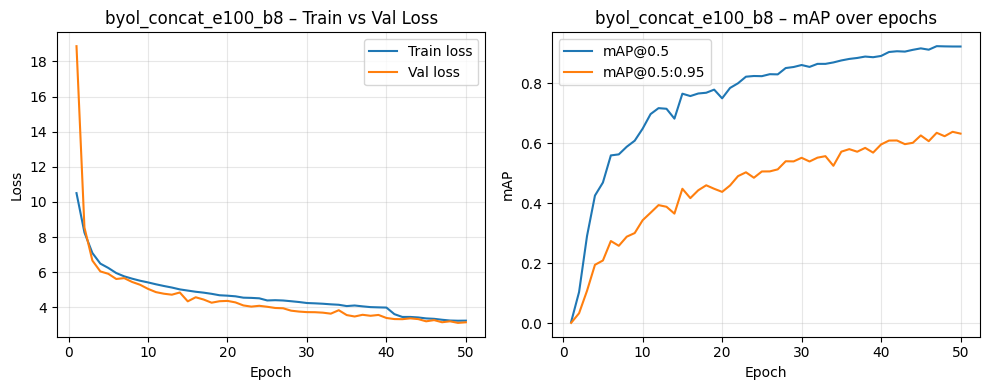

Ultralytics 8.3.240 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO12n summary (fused): 159 layers, 2,556,923 parameters, 0 gradients
val: Fast image access ✅ (ping: 0.9±0.9 ms, read: 130.4±73.5 MB/s, size: 82.8 KB)
val: Scanning /kaggle/input/weeds-dataset/test/labels... 631 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 631/631 213.0it/s 3.0s
WARNING ⚠️ val: Cache directory /kaggle/input/weeds-dataset/test is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 40/40 6.5it/s 6.2s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        631       1654      0.902      0.841      0.925      0.651
Speed: 1.1ms preprocess, 4.1ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /kaggle/working/runs/detect/val

🔎 Test metrics for byol_concat_e100_b8
mAP@0.5: 0.9252594257775324
mAP@0.5:0.95: 0.6505438679132907
Precision: 0.9020999002481708
Recall: 0.8412265880020904
F1 Score: 0.87060045979621


In [16]:
# ============================================================
# Run all downstream experiments
# ============================================================
for exp in DOWNSTREAM_EXPERIMENTS:
    row = run_downstream_experiment(exp)
    if row is not None:
        results_rows.append(row)

In [17]:
# ============================================================
# Performance table (Self-Supervised 2 – BYOL)
# ============================================================
df_results_byol = pd.DataFrame(results_rows)

if len(df_results_byol) == 0:
    print("⚠️ No downstream results collected (missing backbones or training not run).")
else:
    df_results_byol_sorted = df_results_byol.sort_values(
        "mAP@0.5:0.95", ascending=False
    ).reset_index(drop=True)

    display(df_results_byol_sorted)

    out_table = WORK_DIR / "byol_merged_results.csv"
    df_results_byol_sorted.to_csv(out_table, index=False)
    print("Saved:", out_table)

,Run,Model,Type,mAP@0.5,mAP@0.5:0.95,Precision,Recall,F1 Score,weights_path,backbone_path
0,byol_concat_e100_b8,YOLOv12n + byol_concat_e100_b8,Self-Supervised (BYOL) + Supervised fine-tune,0.925259,0.650544,0.9021,0.841227,0.8706,/kaggle/working/weeds_yolov12_byol_byol_concat...,/kaggle/working/byol_backbones/byol_concat_e10...


Saved: /kaggle/working/byol_merged_results.csv


In [18]:
# ============================================================
# Select best BYOL model for qualitative + XAI
# ============================================================
BEST_WEIGHTS = None
BEST_RUN_NAME = None

if len(df_results_byol) > 0:
    df_sorted = df_results_byol.sort_values("mAP@0.5:0.95", ascending=False).reset_index(drop=True)
    BEST_WEIGHTS = df_sorted.loc[0, "weights_path"]
    BEST_RUN_NAME = df_sorted.loc[0, "Run"]
    print("✅ Best BYOL downstream run:", BEST_RUN_NAME)
    print("✅ BEST_WEIGHTS:", BEST_WEIGHTS)
else:
    print("⚠️ BEST_WEIGHTS not set (no results).")

✅ Best BYOL downstream run: byol_concat_e100_b8
✅ BEST_WEIGHTS: /kaggle/working/weeds_yolov12_byol_byol_concat_e100_b8/byol_concat_e100_b8/weights/best.pt


# 4) Qualitative Predictions 🖼️ (Ground Truth vs Prediction)
Quick visual sanity check using the best BYOL downstream model.

/tmp/ipykernel_19/3927939416.py:65: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_19/3927939416.py:65: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


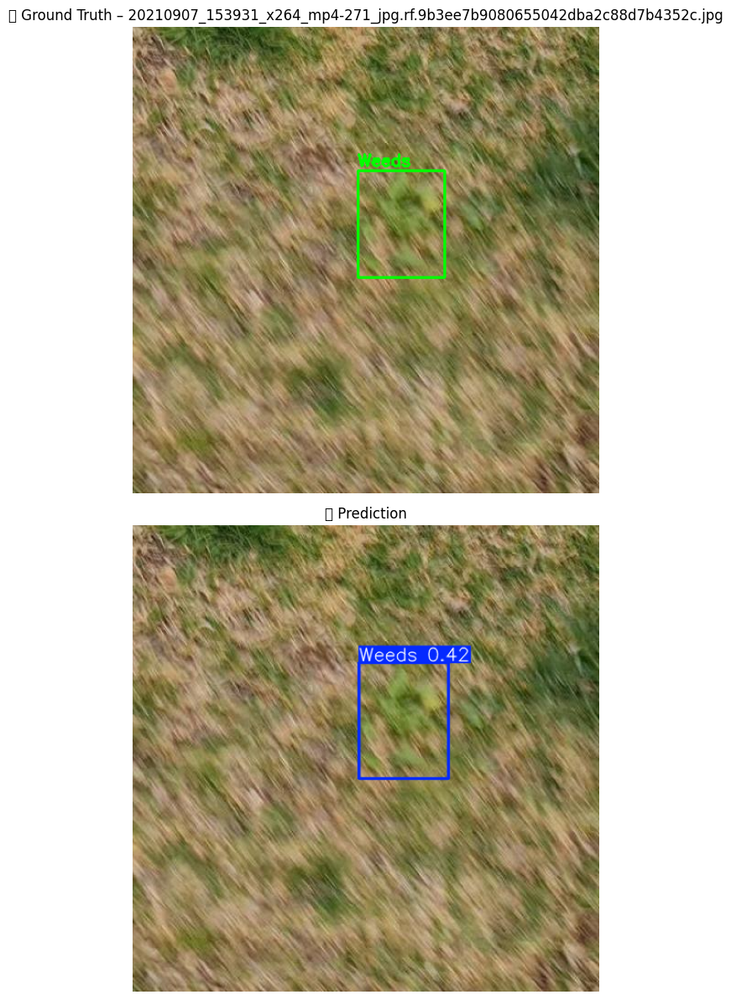

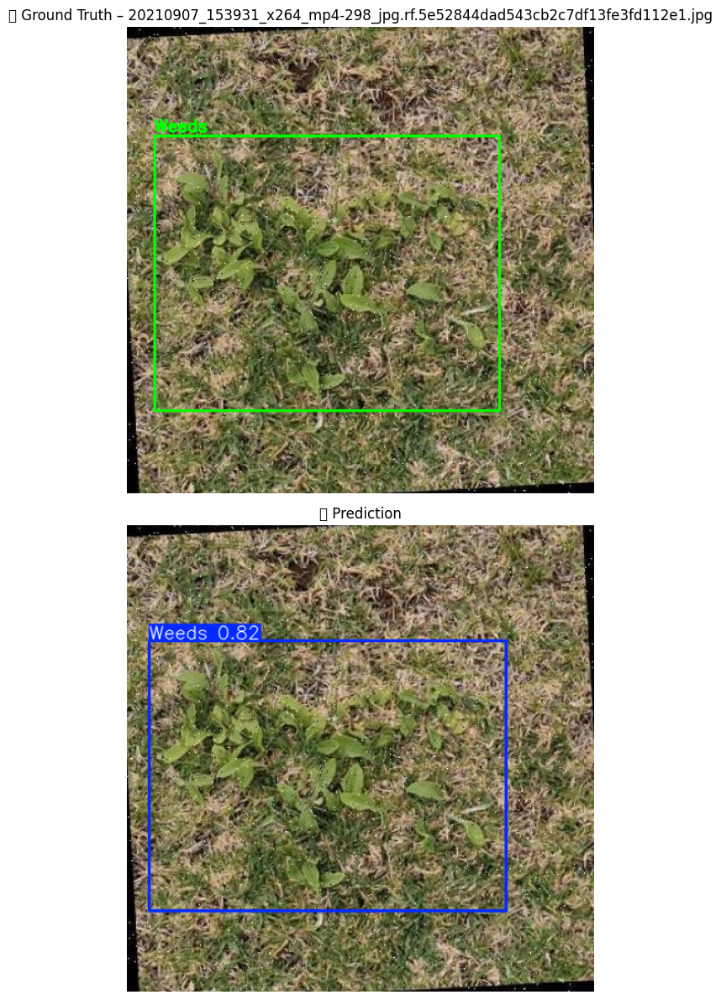

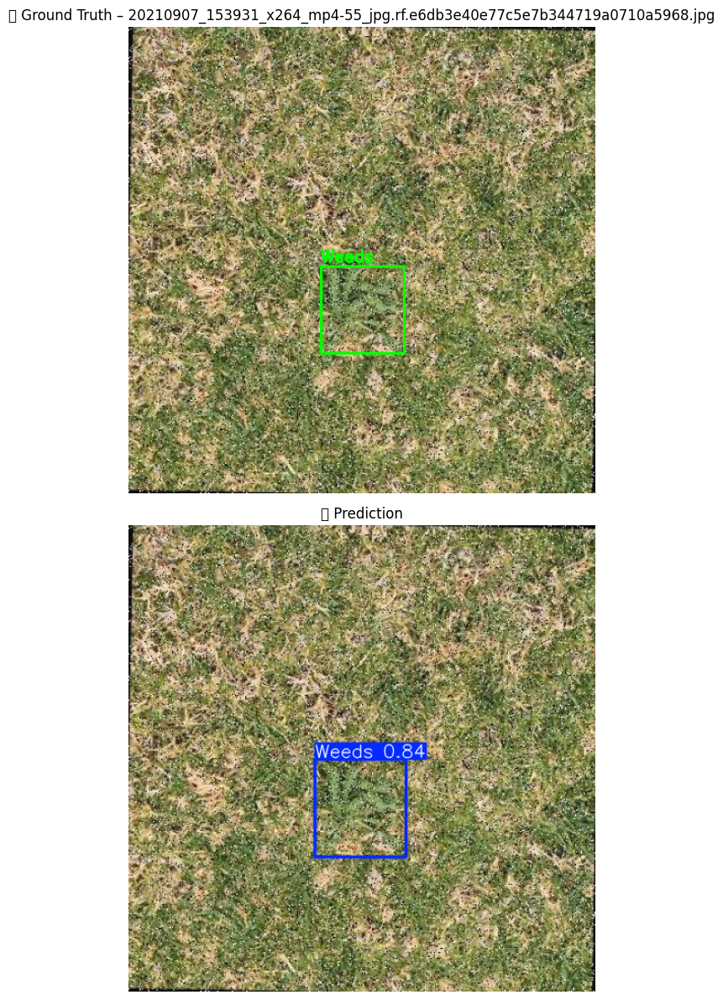

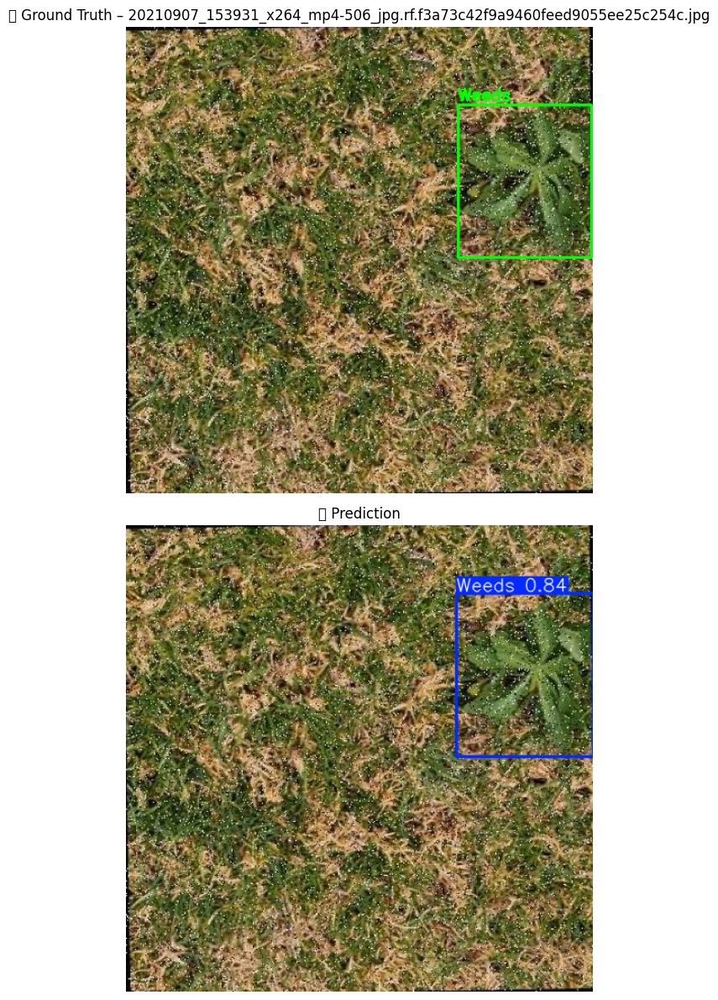

In [19]:
def draw_yolo_labels(img_path: Path, label_path: Path, class_names):
    img = cv2.imread(str(img_path))
    if img is None:
        return None
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    if not label_path.exists():
        return img

    txt = label_path.read_text().strip()
    if not txt:
        return img

    for line in txt.splitlines():
        parts = line.strip().split()
        if len(parts) < 5:
            continue
        cls, x, y, bw, bh = map(float, parts[:5])
        cls = int(cls)

        x1 = int((x - bw/2) * w)
        y1 = int((y - bh/2) * h)
        x2 = int((x + bw/2) * w)
        y2 = int((y + bh/2) * h)

        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        name = class_names[cls] if cls < len(class_names) else str(cls)
        cv2.putText(img, name, (x1, max(0, y1-5)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
    return img

def show_gt_vs_pred(model: YOLO, image_dir: Path, label_dir: Path, n_images=4, conf=0.25):
    img_paths = []
    for ext in IMG_EXTS:
        img_paths.extend(list(Path(image_dir).glob(f"*{ext}")))
    if len(img_paths) == 0:
        print("No images in:", image_dir)
        return

    rnd = random.Random(SEED)
    rnd.shuffle(img_paths)
    img_paths = img_paths[:n_images]

    for img_path in img_paths:
        label_path = Path(label_dir) / (img_path.stem + ".txt")

        gt_im = draw_yolo_labels(img_path, label_path, CLASS_NAMES)
        pred = model.predict(str(img_path), conf=conf, verbose=False, device=YOLO_DEVICE)[0]
        pred_bgr = pred.plot()  # BGR
        pred_rgb = cv2.cvtColor(pred_bgr, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(6, 12))

        plt.subplot(2, 1, 1)
        plt.imshow(gt_im)
        plt.title(f"✅ Ground Truth – {img_path.name}")
        plt.axis("off")

        plt.subplot(2, 1, 2)
        plt.imshow(pred_rgb)
        plt.title("🎯 Prediction")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

if BEST_WEIGHTS is not None:
    best_det = YOLO(BEST_WEIGHTS)
    show_gt_vs_pred(
        best_det,
        image_dir=DATA_ROOT / "test" / "images",
        label_dir=DATA_ROOT / "test" / "labels",
        n_images=4,
        conf=0.25
    )

# 5) Explainability 🧠✨ (ScoreCAM + EigenCAM Grid)

✅ Plotting rules:
- **Columns:** Original | ScoreCAM | EigenCAM | Prediction  
- **Rows:** Model names vertically

⚡ Runtime note:
- ScoreCAM is expensive (many forward passes).
- Use `SCORECAM_CHANNELS = 12` for speed.

In [20]:
# ============================================================
# CAM Utilities (ScoreCAM + EigenCAM)
# ============================================================
def find_cam_layer_by_shape(yolo: YOLO, img_bgr: np.ndarray, imgsz: int = 640, device=YOLO_DEVICE,
                            min_hw: int = 10):
    chosen = {"layer": None, "hw": None}

    hooks = []
    def make_hook(m):
        def _hook(_, __, out):
            t = out[0] if isinstance(out, (tuple, list)) else out
            if torch.is_tensor(t) and t.dim() == 4:
                _, _, h, w = t.shape
                if h >= min_hw and w >= min_hw:
                    chosen["layer"] = m
                    chosen["hw"] = (h, w)
        return _hook

    for m in yolo.model.modules():
        if isinstance(m, nn.Conv2d):
            hooks.append(m.register_forward_hook(make_hook(m)))

    try:
        yolo.predict(img_bgr, imgsz=imgsz, conf=0.25, iou=0.7, device=device, verbose=False)
    finally:
        for h in hooks:
            h.remove()

    if chosen["layer"] is None:
        raise RuntimeError("Could not find a suitable conv layer for CAM.")
    return chosen["layer"]

def find_last_conv_layer(module: nn.Module) -> nn.Module:
    last = None
    for m in module.modules():
        if isinstance(m, nn.Conv2d):
            last = m
    if last is None:
        raise ValueError("No Conv2d layer found.")
    return last

def normalize01(x: np.ndarray, eps: float = 1e-6) -> np.ndarray:
    x = x.astype(np.float32)
    mn, mx = float(np.min(x)), float(np.max(x))
    if (mx - mn) < eps:
        return np.zeros_like(x, dtype=np.float32)
    return (x - mn) / (mx - mn + eps)

def overlay_heatmap(rgb_uint8: np.ndarray, heat01: np.ndarray, alpha: float = 0.45) -> np.ndarray:
    heat_u8 = np.uint8(np.clip(heat01, 0, 1) * 255)
    heat_bgr = cv2.applyColorMap(heat_u8, cv2.COLORMAP_JET)
    heat_rgb = cv2.cvtColor(heat_bgr, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

    base = rgb_uint8.astype(np.float32) / 255.0
    out = (1 - alpha) * base + alpha * heat_rgb
    return np.clip(out, 0, 1)

def eigencam_from_activations(acts_chw: np.ndarray) -> np.ndarray:
    # EigenCAM = first SVD component of activations (C,H,W)
    C, H, W = acts_chw.shape
    A = acts_chw.reshape(C, -1).T  # (H*W, C)
    A = np.nan_to_num(A)
    _, _, Vt = np.linalg.svd(A, full_matrices=False)
    pc = Vt[0]  # (C,)
    cam = (A @ pc).reshape(H, W)
    cam = np.maximum(cam, 0)
    return normalize01(cam)

def detection_score_sum_conf(
    yolo: YOLO,
    img_bgr: np.ndarray,
    class_id: int = 0,
    imgsz: int = 640,
    conf: float = 0.05,
    iou: float = 0.7,
    device=YOLO_DEVICE
) -> float:
    res = yolo.predict(img_bgr, imgsz=imgsz, conf=conf, iou=iou, device=device, verbose=False)[0]
    if res.boxes is None or len(res.boxes) == 0:
        return 0.0
    cls = res.boxes.cls.detach().cpu().numpy().astype(int)
    confs = res.boxes.conf.detach().cpu().numpy().astype(np.float32)
    confs = confs[cls == int(class_id)] if class_id is not None else confs
    return float(np.sum(confs)) if confs.size else 0.0

def scorecam_from_activations(
    yolo: YOLO,
    base_bgr: np.ndarray,
    acts_chw: np.ndarray,
    class_id: int = 0,
    imgsz: int = 640,
    max_channels: int = 12,
    conf_score: float = 0.001,
    iou_score: float = 0.7,
    device=YOLO_DEVICE,
):
    C, H, W = acts_chw.shape
    flat = acts_chw.reshape(C, -1)
    var = flat.var(axis=1)

    k = int(min(max_channels, C))
    top_idx = np.argsort(-var)[:k]

    base_float = base_bgr.astype(np.float32) / 255.0
    heat = np.zeros((imgsz, imgsz), dtype=np.float32)

    for ch in top_idx:
        amap = acts_chw[ch]
        amap01 = normalize01(amap)
        mask = cv2.resize(amap01, (imgsz, imgsz), interpolation=cv2.INTER_LINEAR)
        mask = np.clip(mask, 0, 1)

        masked = base_float * mask[..., None]
        masked_u8 = np.uint8(np.clip(masked * 255.0, 0, 255))

        s = detection_score_sum_conf(
            yolo=yolo,
            img_bgr=masked_u8,
            class_id=class_id,
            imgsz=imgsz,
            conf=conf_score,
            iou=iou_score,
            device=device
        )
        heat += (s * mask.astype(np.float32))

    return normalize01(np.maximum(heat, 0))

def capture_activations_via_hook(
    yolo: YOLO,
    img_bgr: np.ndarray,
    target_layer: nn.Module,
    imgsz: int = 640,
    conf_pred: float = 0.25,
    iou_pred: float = 0.7,
    device=YOLO_DEVICE,
):
    cache = {"acts": None}

    def _hook(_, __, output):
        t = output[0] if isinstance(output, (tuple, list)) else output
        if torch.is_tensor(t):
            cache["acts"] = t.detach().float().cpu()

    h = target_layer.register_forward_hook(_hook)
    try:
        res = yolo.predict(img_bgr, imgsz=imgsz, conf=conf_pred, iou=iou_pred, device=device, verbose=False)
    finally:
        h.remove()

    if cache["acts"] is None:
        raise RuntimeError("No activations captured. Try a different target layer.")
    acts = cache["acts"]
    if acts.dim() == 3:
        acts = acts.unsqueeze(0)
    return res[0], acts[0].numpy()

def list_images(img_dir: Path):
    files = []
    for ext in IMG_EXTS:
        files.extend(list(img_dir.glob(f"*{ext}")))
    return sorted(files)

def plot_xai_grid(
    models: dict,
    img_path: Path,
    class_id: int = 0,
    imgsz: int = 640,
    conf_pred: float = 0.25,
    iou_pred: float = 0.7,
    scorecam_channels: int = 12,
):
    bgr0 = cv2.imread(str(img_path))
    if bgr0 is None:
        raise FileNotFoundError(f"Could not read image: {img_path}")

    base_bgr = cv2.resize(bgr0, (imgsz, imgsz), interpolation=cv2.INTER_LINEAR)
    base_rgb = cv2.cvtColor(base_bgr, cv2.COLOR_BGR2RGB)

    rows = []
    for row_name, weights in models.items():
        try:
            rows.append((row_name, YOLO(str(weights))))
        except Exception as e:
            print(f"[WARN] Skip {row_name}: {e}")

    if len(rows) == 0:
        raise RuntimeError("No models loaded for grid.")

    n = len(rows)
    fig, axes = plt.subplots(n, 4, figsize=(4 * 4.2, n * 4.2))
    if n == 1:
        axes = axes.reshape(1, 4)

    titles = ["Original", "ScoreCAM", "EigenCAM", "Prediction"]
    for j, t in enumerate(titles):
        axes[0, j].set_title(t, fontsize=13, fontweight="bold")

    for i, (row_name, yolo) in enumerate(rows):
        target_layer = find_cam_layer_by_shape(yolo, base_bgr, imgsz=imgsz, device=YOLO_DEVICE, min_hw=10)


        r, acts_chw = capture_activations_via_hook(
            yolo=yolo,
            img_bgr=base_bgr,
            target_layer=target_layer,
            imgsz=imgsz,
            conf_pred=conf_pred,
            iou_pred=iou_pred,
            device=YOLO_DEVICE,
        )

        axes[i, 0].imshow(base_rgb)
        axes[i, 0].axis("off")
        axes[i, 0].set_ylabel(row_name, fontsize=12, fontweight="bold", rotation=90)

        sc = scorecam_from_activations(
            yolo=yolo,
            base_bgr=base_bgr,
            acts_chw=acts_chw,
            class_id=class_id,
            imgsz=imgsz,
            max_channels=scorecam_channels,
            conf_score=0.05,
            iou_score=iou_pred,
            device=YOLO_DEVICE,
        )
        axes[i, 1].imshow(overlay_heatmap(base_rgb, sc, alpha=0.45))
        axes[i, 1].axis("off")

        ec_small = eigencam_from_activations(acts_chw)
        ec = cv2.resize(ec_small, (imgsz, imgsz), interpolation=cv2.INTER_LINEAR)
        axes[i, 2].imshow(overlay_heatmap(base_rgb, ec, alpha=0.45))
        axes[i, 2].axis("off")

        pred_rgb = cv2.cvtColor(r.plot(), cv2.COLOR_BGR2RGB)
        axes[i, 3].imshow(pred_rgb)
        axes[i, 3].axis("off")

    plt.tight_layout()
    plt.show()

Sample image: 20210907_153931_x264_mp4-1351_jpg.rf.515739515a882444bbf4a934f1717017.jpg


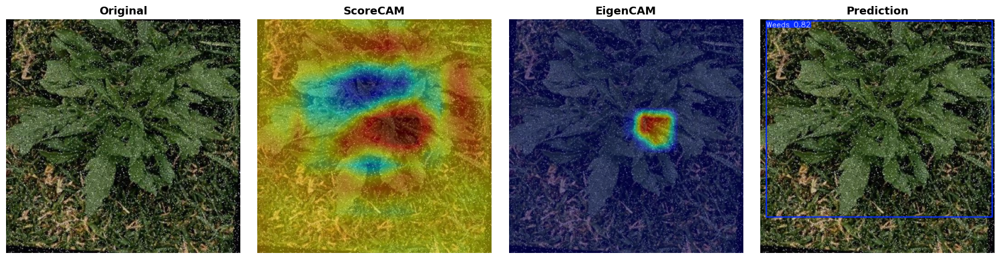

In [21]:
# ============================================================
# Run XAI grid on one test image
# Rows: Baseline YOLOv12n (optional if weights exist) + Best BYOL
# ============================================================
if BEST_WEIGHTS is not None:
    test_dir = DATA_ROOT / "test" / "images"
    test_imgs_list = list_images(test_dir)
    assert len(test_imgs_list) > 0, "No test images found."

    rnd = random.Random(SEED)
    sample_img = Path(rnd.choice(test_imgs_list))
    print("Sample image:", sample_img.name)

    MODEL_ZOO = {}

    # Optional: include your supervised baseline weights if available
    BASELINE_BEST = Path("/kaggle/working/weeds_yolov12_train/yolov12_weeds/weights/best.pt")
    if BASELINE_BEST.exists():
        MODEL_ZOO["YOLOv12n (Supervised Baseline)"] = str(BASELINE_BEST)

    MODEL_ZOO[f"YOLOv12n + BYOL (Best: {BEST_RUN_NAME})"] = str(BEST_WEIGHTS)

    SCORECAM_CHANNELS = 12

    plot_xai_grid(
        models=MODEL_ZOO,
        img_path=sample_img,
        class_id=0,
        imgsz=640,
        conf_pred=0.25,
        iou_pred=0.7,
        scorecam_channels=SCORECAM_CHANNELS,
    )

# ✅ Final Summary (Merged BYOL Notebook)
- Built a consistent **SSL split** (80/10/10 + 20/80 inside train) 🔀  
- Ran **BYOL pretext** on **unlabeled weeds images** using YOLOv12n backbone+neck 🧠🌱  
- Saved BYOL backbone weights to: `/kaggle/working/byol_backbones/*.pth` 📦  
- Fine‑tuned YOLOv12n detectors for each BYOL backbone 🎯  
- Evaluated on test + saved results table to: `/kaggle/working/byol_merged_results.csv` 📈  
- Added **ScoreCAM + EigenCAM** grid in the exact YOLO‑style layout 🧠✨